In [27]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [28]:
!pip install keras-ocr

In [29]:
import matplotlib.pyplot as plt
import keras_ocr
import os

In [30]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [31]:
!mkdir uploads

mkdir: cannot create directory ‘uploads’: File exists


## Upload files (images with text) form your local filesystem

In [32]:
from google.colab import files
uploaded = files.upload()
uploaded_files = list(uploaded.keys())
for uploaded_file in uploaded_files:
  print(uploaded_file)
  !mv $uploaded_file uploads/$uploaded_file

Saving 1.jpg to 1.jpg
Saving 2.jpg to 2.jpg
Saving 3.jpg to 3.jpg
Saving 4.jpg to 4.jpg
Saving 5.jpg to 5.jpg
Saving 6.jpg to 6.jpg
Saving 7.jpg to 7.jpg
Saving 8.jpg to 8.jpg
Saving 10.jpg to 10.jpg
Saving 11.jpg to 11.jpg
Saving 12.jpg to 12.jpg
Saving 14.jpg to 14.jpg
Saving 15.jpg to 15.jpg
Saving 16.jpg to 16.jpg
Saving 17.jpg to 17.jpg
Saving 18.jpg to 18.jpg
Saving 19.jpg to 19.jpg
Saving 20.jpg to 20.jpg
Saving 21.jpg to 21.jpg
Saving 22.jpg to 22.jpg
Saving 23.jpg to 23.jpg
Saving 24.jpg to 24.jpg
Saving 25.jpg to 25.jpg
Saving 26.jpg to 26.jpg
Saving 27.jpg to 27.jpg
Saving 28.jpg to 28.jpg
Saving 29.jpg to 29.jpg
Saving 30.jpg to 30.jpg
Saving 31.jpg to 31.jpg
Saving 32.jpg to 32.jpg
Saving 33.jpg to 33.jpg
Saving 34.jpg to 34.jpg
Saving 35.jpg to 35.jpg
Saving 36.jpg to 36.jpg
Saving 37.jpg to 37.jpg
Saving 38.jpg to 38.jpg
Saving 39.jpg to 39.jpg
Saving 40.jpg to 40.jpg
Saving 41.jpg to 41.jpg
Saving 42.jpg to 42.jpg
Saving 43.jpg to 43.jpg
Saving 44.jpg to 44.jpg
Saving 4

In [33]:
!dir

sample_data  uploads


In [34]:
uploads_dir = "/content/uploads"
custom_images = []

for filename in os.listdir(uploads_dir):
    print(os.path.join(uploads_dir, filename))
    custom_images.append(os.path.join(uploads_dir, filename))

images = [ keras_ocr.tools.read(path) for path in custom_images]

/content/uploads/42.jpg
/content/uploads/51.jpg
/content/uploads/35.jpg
/content/uploads/52.jpg
/content/uploads/40.jpg
/content/uploads/15.jpg
/content/uploads/50.jpg
/content/uploads/43.jpg
/content/uploads/20.jpg
/content/uploads/3.jpg
/content/uploads/16.jpg
/content/uploads/54.jpg
/content/uploads/60.jpg
/content/uploads/59.jpg
/content/uploads/46.jpg
/content/uploads/19.jpg
/content/uploads/8.jpg
/content/uploads/7.jpg
/content/uploads/10.jpg
/content/uploads/63.jpg
/content/uploads/29.jpg
/content/uploads/66.jpg
/content/uploads/38.jpg
/content/uploads/24.jpg
/content/uploads/41.jpg
/content/uploads/64.jpg
/content/uploads/47.jpg
/content/uploads/57.jpg
/content/uploads/65.jpg
/content/uploads/69.jpg
/content/uploads/45.jpg
/content/uploads/55.jpg
/content/uploads/49.jpg
/content/uploads/26.jpg
/content/uploads/2.jpg
/content/uploads/14.jpg
/content/uploads/30.jpg
/content/uploads/25.jpg
/content/uploads/21.jpg
/content/uploads/34.jpg
/content/uploads/18.jpg
/content/uploads/67.

In [35]:
# Each list of predictions in prediction_groups is a list of
# (word, box) tuples.
%time 
predictions = pipeline.recognize(images)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


#Will Used KerasOCR for Text and Character Segmentation and LSTM Backed Tesseract for recognition


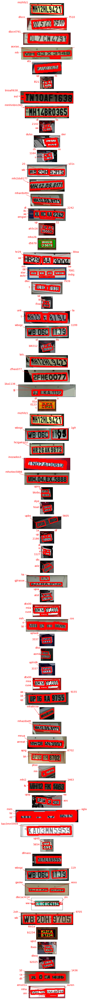

In [36]:

fig, axs = plt.subplots(nrows=len(images), figsize=(100, 100))
if(len(custom_images) == 1):
  for image, prediction in zip(images, predictions):
    keras_ocr.tools.drawAnnotations(image=image, predictions=prediction, ax=axs)
else:
  for ax, image, prediction in zip(axs, images, predictions):
    keras_ocr.tools.drawAnnotations(image=image, predictions=prediction, ax=ax)

#Found Out KerasOCR Accuratly Segmenting Text And Characters

In [38]:
!sudo apt-get install tesseract-ocr
!sudo apt-get install -y libleptonica-dev
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.


In [40]:
import pytesseract

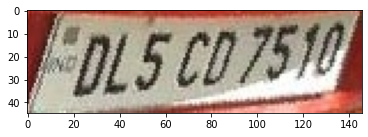

In [16]:
plt.imshow(images[1])
plt.show()

In [41]:
import numpy
import cv2
predictions[1][-1][-1].astype(numpy.int32)

array([[18, 11],
       [93,  6],
       [95, 34],
       [20, 39]], dtype=int32)

In [44]:
def order_points(pts):
	rect = np.zeros((4, 2), dtype = "float32")

	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]

	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]

	return rect
def four_point_transform(image, pts):
	rect = order_points(pts)
	(tl, tr, br, bl) = rect

	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))

	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))

	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")

	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

	return warped


In [45]:
import numpy as np

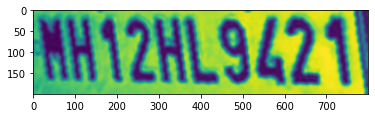

['WHI2HL9424)\n\x0c']


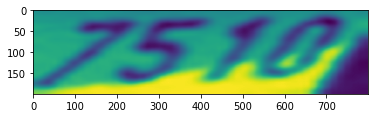

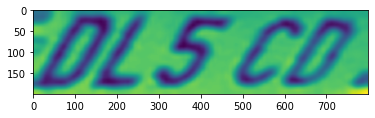

['ASIF 4\n\x0c', 'LS £2.\n\x0c']


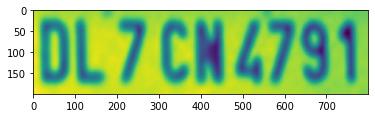

['OL7CN4791\n\x0c']


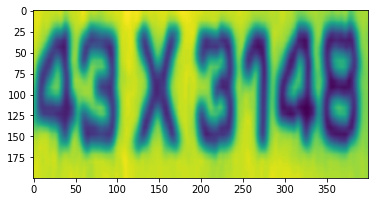

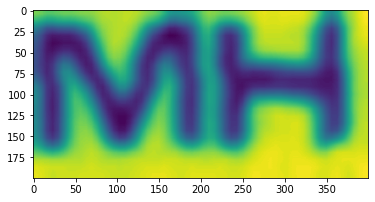

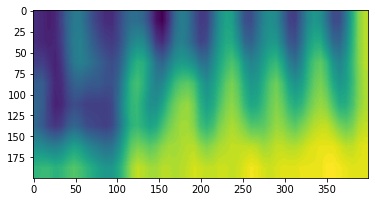

['439148\n\x0c', 'MA\n\x0c', '_\n\x0c']


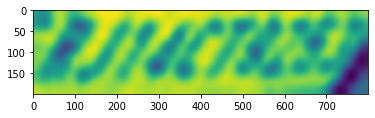

['ANOLE\n\x0c']


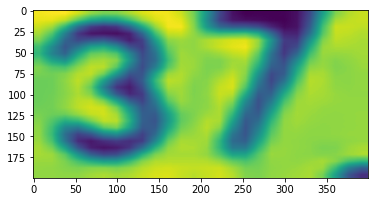

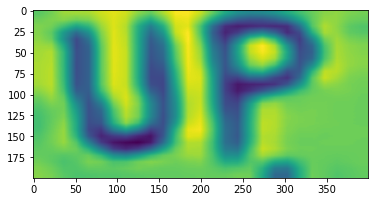

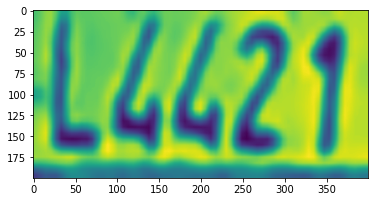

['37.\n\x0c', 'UP\n\x0c', '£4421\n\x0c']


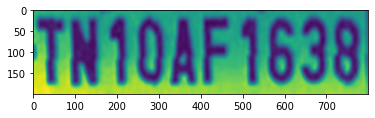

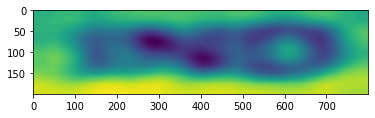

['TWIOAF 1638\n\x0c', '==\n\x0c']


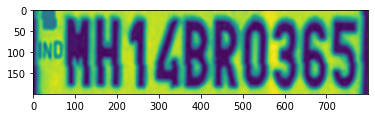

['MH CBRO3E5)\n\x0c']


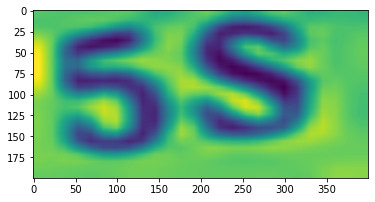

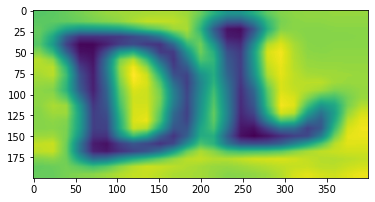

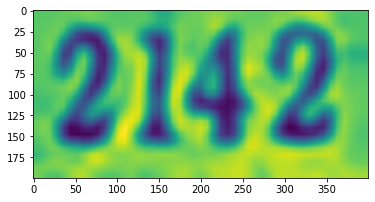

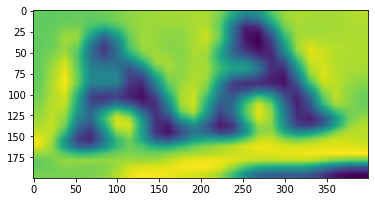

['5S\n\x0c', 'DL\n\x0c', '2142\n\x0c', 'AA\n\x0c']


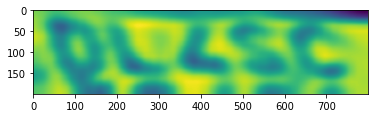

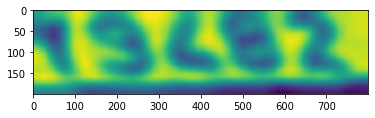

['DU.\n\x0c', '13<éSe\n\x0c']


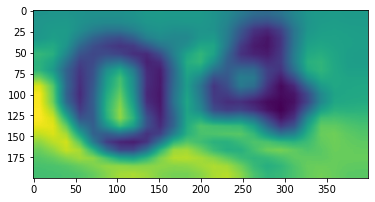

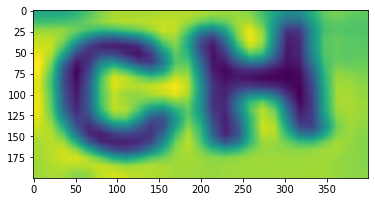

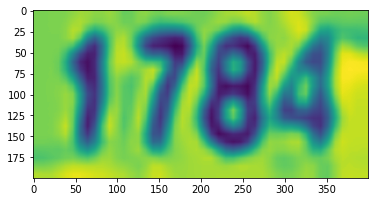

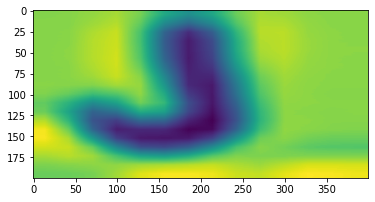

['o4\n\x0c', 'cH\n\x0c', '1784\n\x0c', '=.\n\x0c']


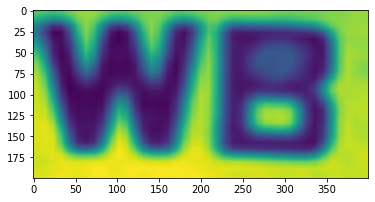

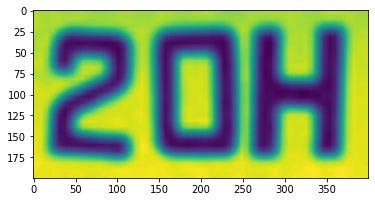

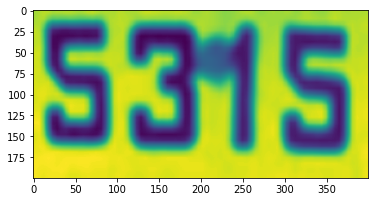

['WB\n\x0c', '20H\n\x0c', '5315\n\x0c']


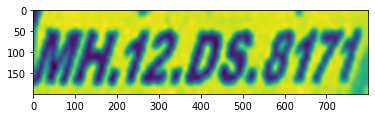

['WH12,08.8171\n\x0c']


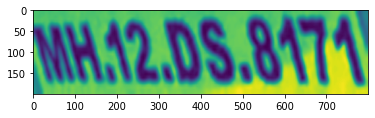

['WANDS. AAT\n\x0c']


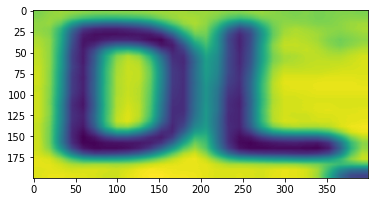

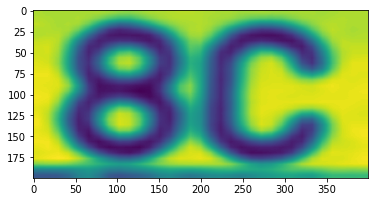

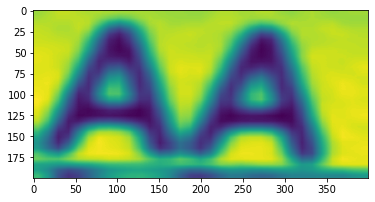

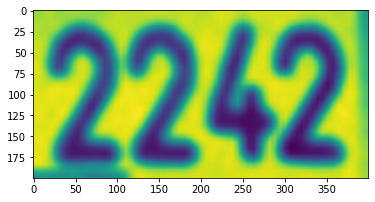

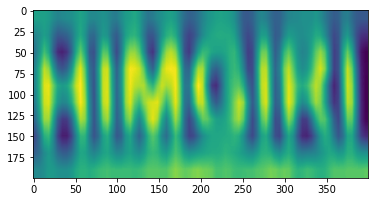

['DL\n\x0c', 'sc\n\x0c', 'AA\n\x0c', '2242\n\x0c', 'NU Atta\n\x0c']


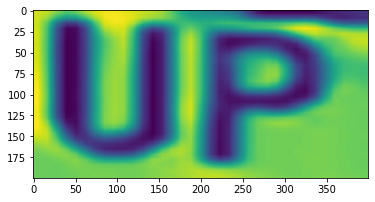

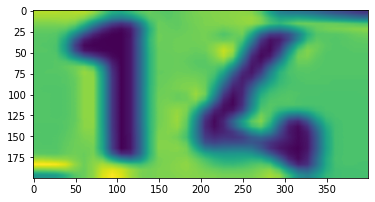

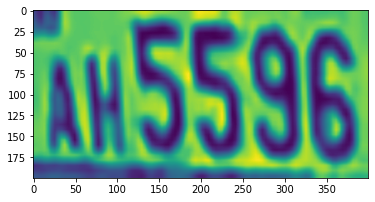

['UP\n\x0c', 'i”\n\x0c', '5596\n\x0c']


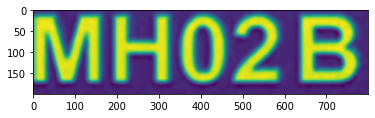

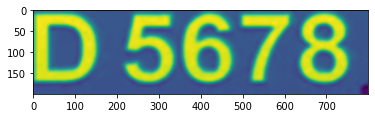

['MHO2B\n\x0c', 'D 5678\n\x0c']


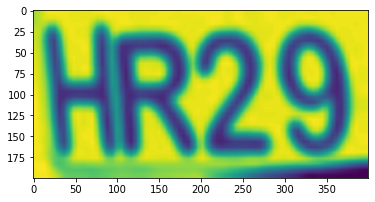

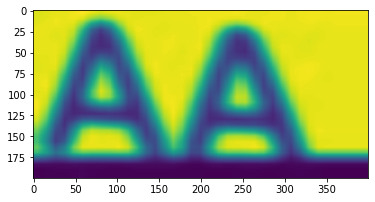

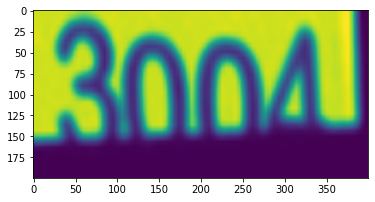

['HR29\n\x0c', 'AA\n\x0c', '3004)\n\x0c']


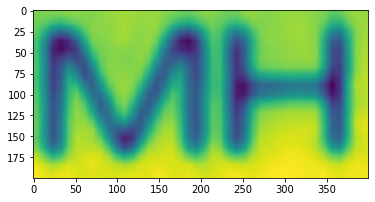

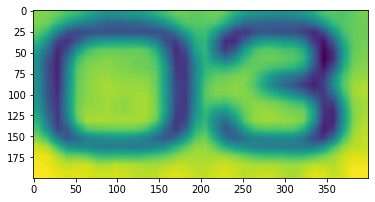

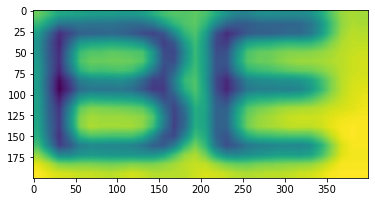

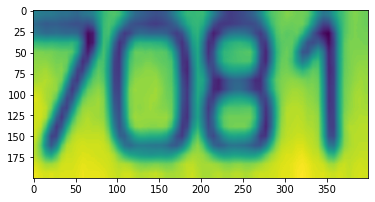

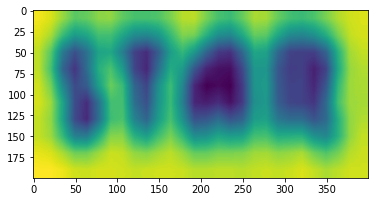

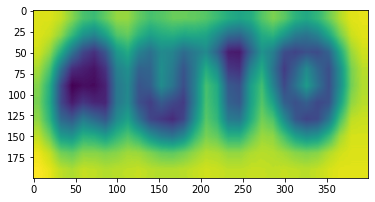

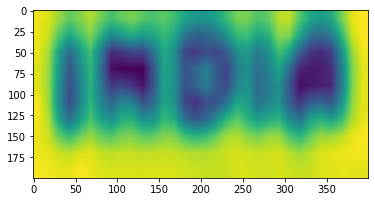

['MH\n\x0c', 'OS\n\x0c', 'BE\n\x0c', '7084\n\x0c', 'tee\n\x0c', 'auto\n\x0c', 'India\n\x0c']


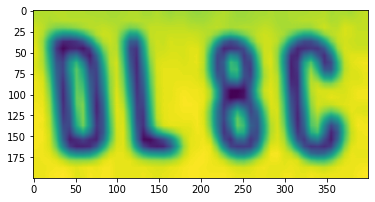

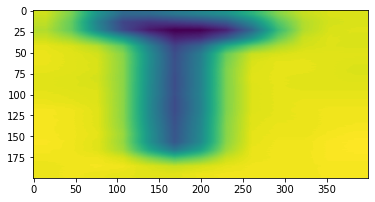

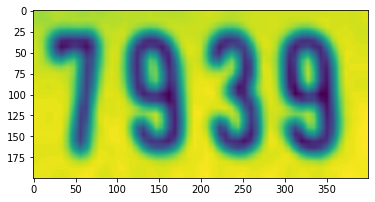

['DL8Ct\n\x0c', '_\n\x0c', '7939\n\x0c']


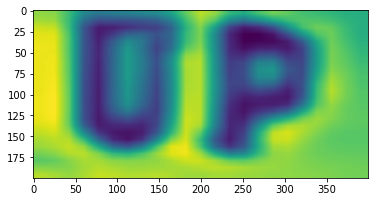

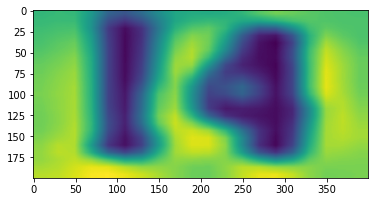

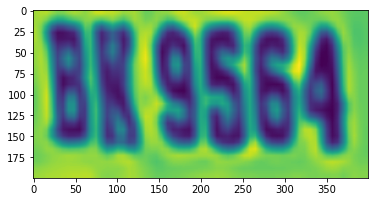

['UP\n\x0c', '4\n\x0c', 'BASSE4\n\x0c']


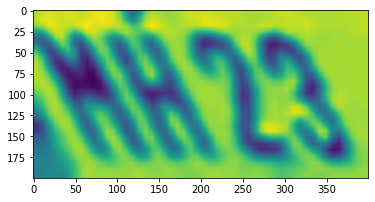

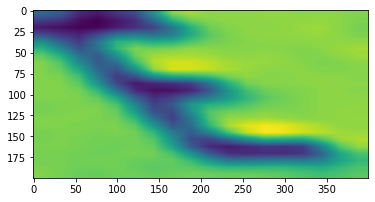

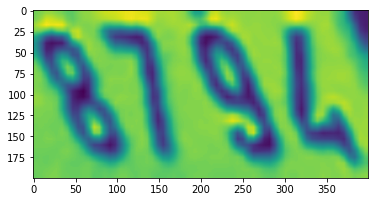

['WAYS,\n\x0c', '—\n\x0c', 'WA\n\x0c']


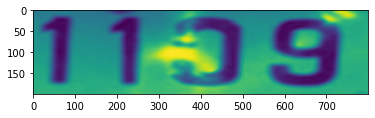

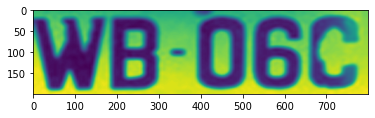

['1173S\n\x0c', 'WB-06C\n\x0c']


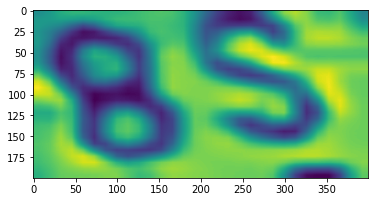

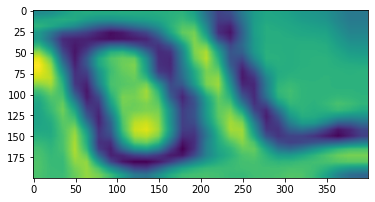

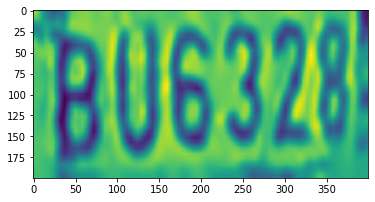

['a>\n\x0c', 'DL\n\x0c', 'BUGIZE\n\x0c']


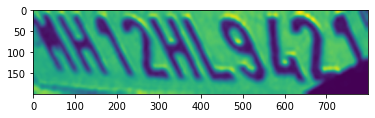

['ANNE\n\x0c']


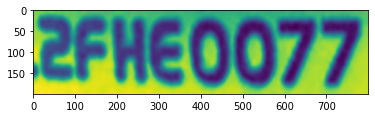

['2FHEO077\n\x0c']


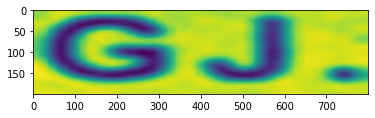

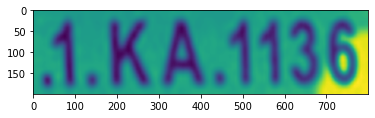

['-\n\x0c', 'AKAAI36\n\x0c']


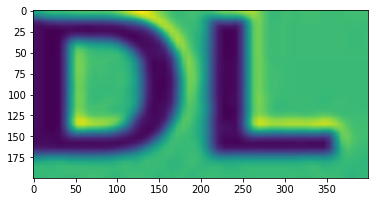

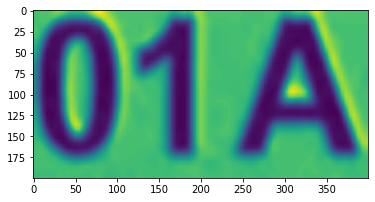

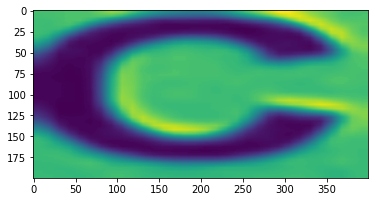

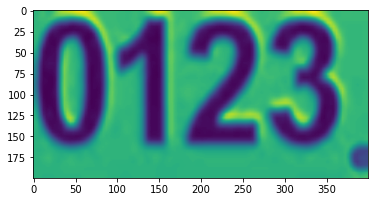

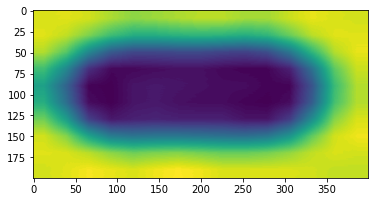

['DL\n\x0c', '01A\n\x0c', 'ca\n\x0c', '0123.\n\x0c', '=\n\x0c']


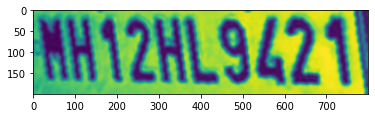

['WHI2HL9424)\n\x0c']


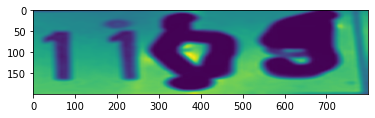

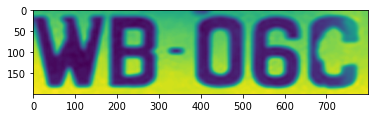

['1198383\n\x0c', 'WB-06C\n\x0c']


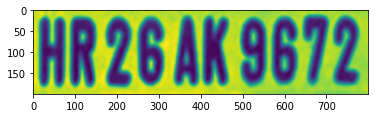

['HR26AK 9672\n\x0c']


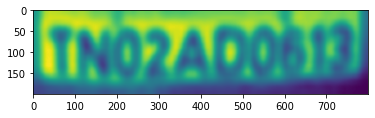

['TNO2AD0812)\n\x0c']


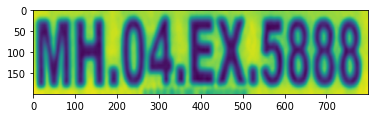

['WH, 04,EX,5888\n\x0c']


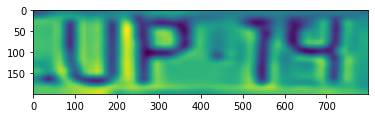

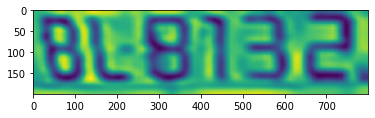

['UP? TS\n\x0c', 'BLBl32.\n\x0c']


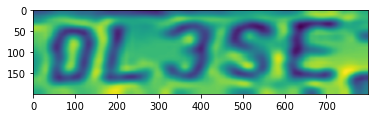

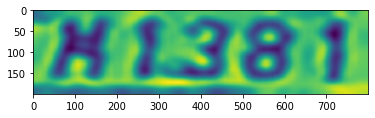

['OLZSE:\n\x0c', 'KBizZ8i\n\x0c']


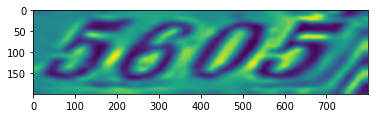

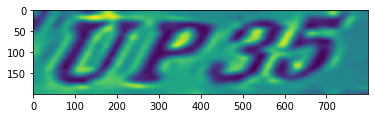

['ZEO0Z,\n\x0c', 'WPI\n\x0c']


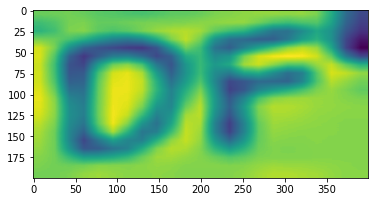

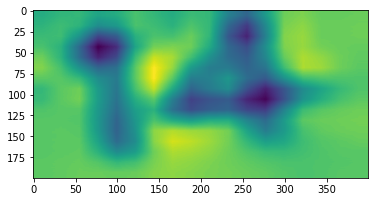

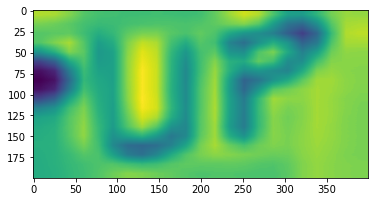

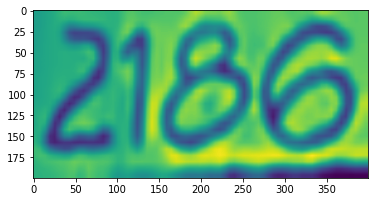

['DF\n\x0c', '1.\n\x0c', 'Ur\n\x0c', '2186\n\x0c']


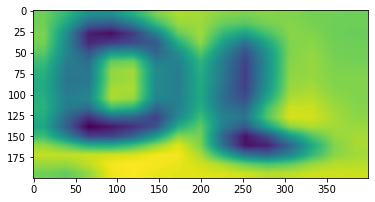

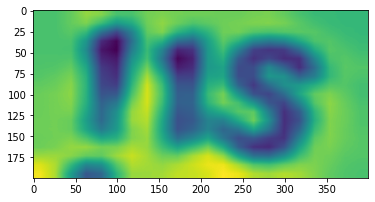

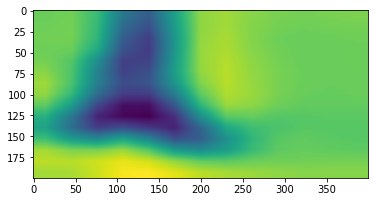

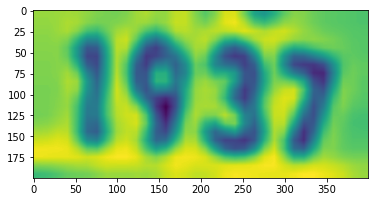

['DL\n\x0c', 'Ns\n\x0c', '~\n\x0c', '1937\n\x0c']


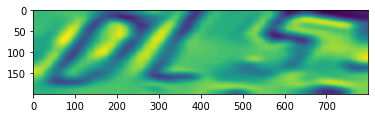

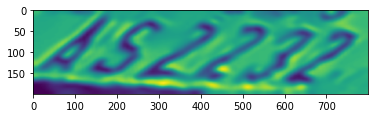

['S Pf & Fn\n\x0c', 'ASEZII2\n\x0c']


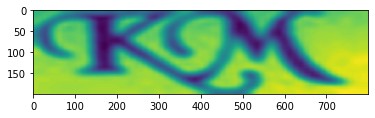

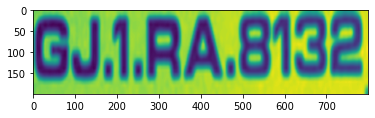

['KM\n\x0c', 'GULRA.8132\n\x0c']


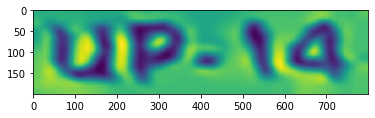

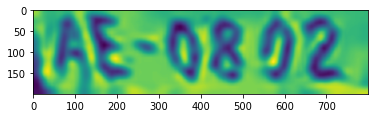

['uP-14a\n\x0c', 'AE-OR 92\n\x0c']


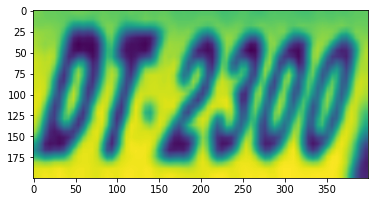

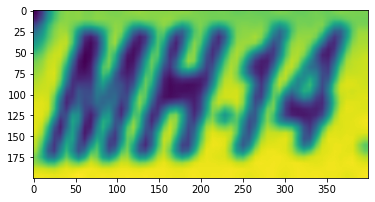

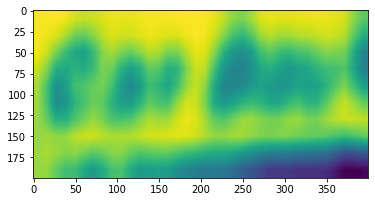

['T2100\n\x0c', 'MATA\n\x0c', 'Cor bow\n\x0c']


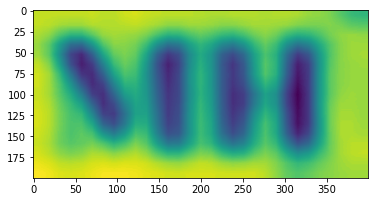

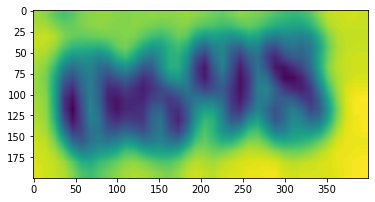

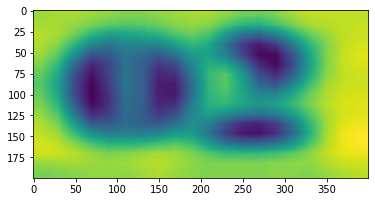

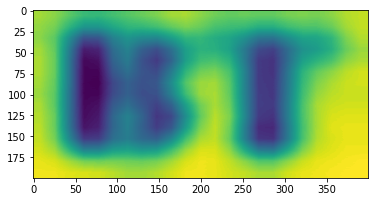

['Men\n\x0c', '6s\n\x0c', 'eo\n\x0c', 'ur\n\x0c']


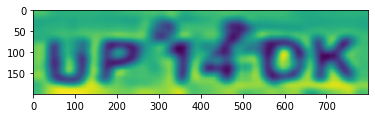

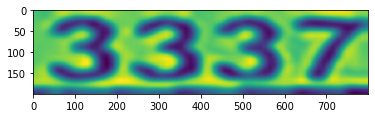

['ue foK\n\x0c', '3337\n\x0c']


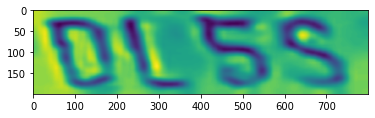

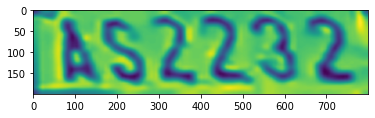

['DSS\n\x0c', 'AS22732\n\x0c']


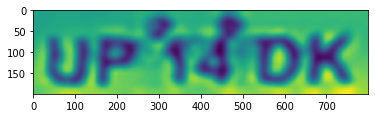

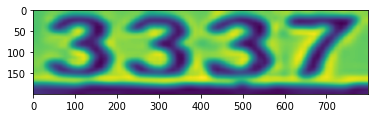

["up 'sdoK\n\x0c", '3337\n\x0c']


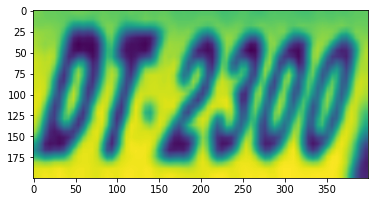

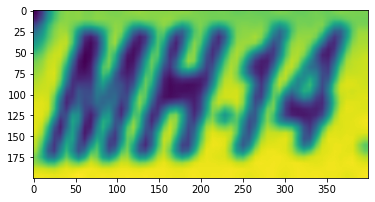

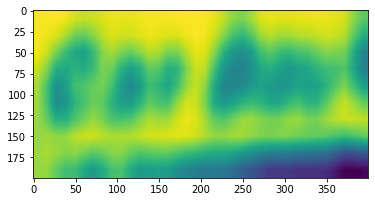

['T2100\n\x0c', 'MATA\n\x0c', 'Cor bow\n\x0c']


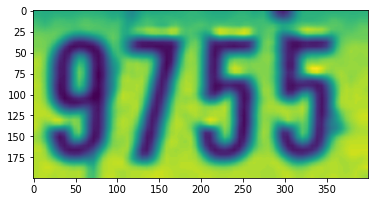

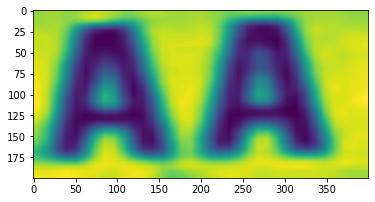

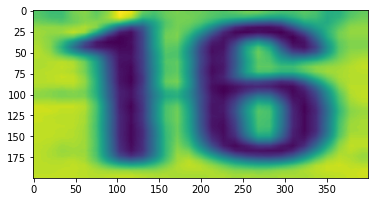

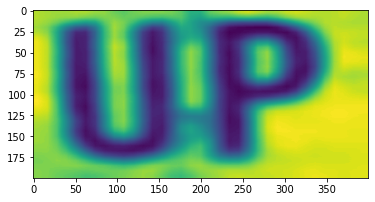

['9755\n\x0c', 'AA\n\x0c', '6S\n\x0c', 'UP\n\x0c']


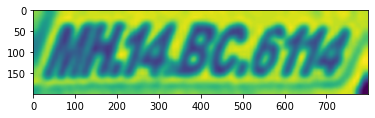

['\\MAIABC.E 14\n\x0c']


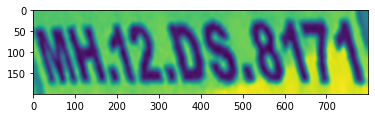

['WAALDS.ATA\n\x0c']


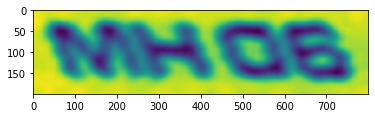

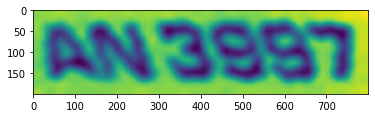

['WHOSE\n\x0c', 'AN 3SS7\n\x0c']


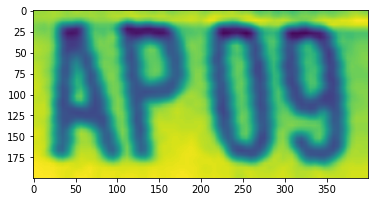

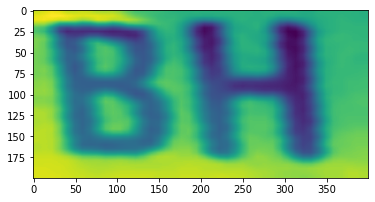

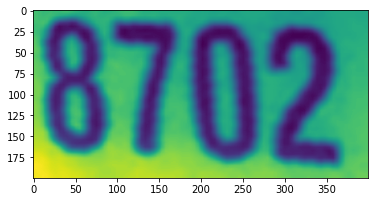

['APQS\n\x0c', 'BH\n\x0c', '8702\n\x0c']


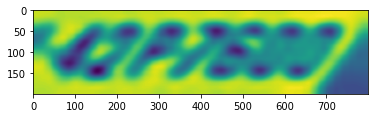

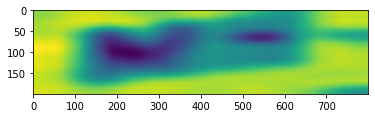

['LAE 4\n\x0c', '= -\n\x0c']


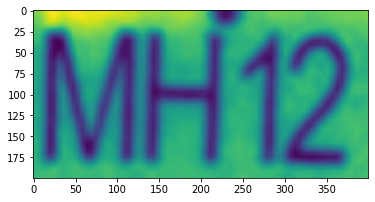

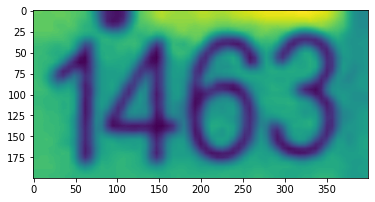

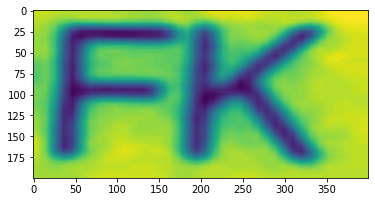

['MH12\n\x0c', '1463\n\x0c', 'FK\n\x0c']


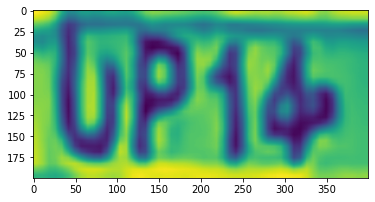

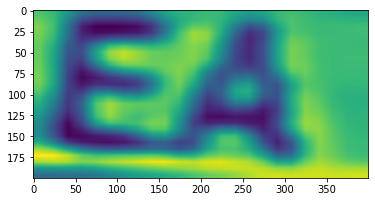

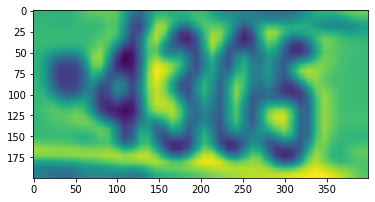

['UPIe\n\x0c', 'EA\n\x0c', '"4305\n\x0c']


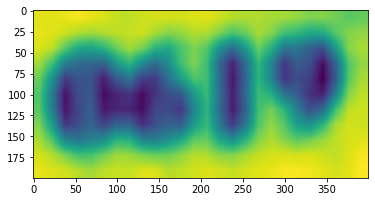

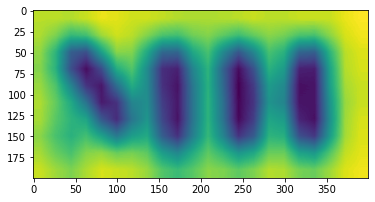

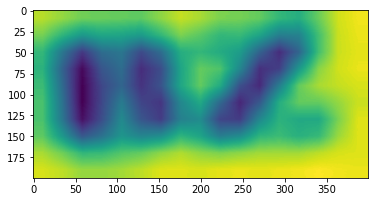

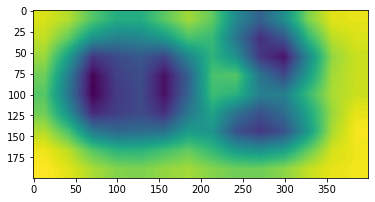

['oo\n\x0c', 'Noe\n\x0c', 'a7\n\x0c', 'e.\n\x0c']


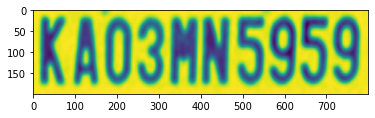

['KAO3MN5959\n\x0c']


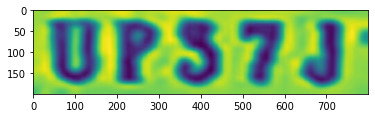

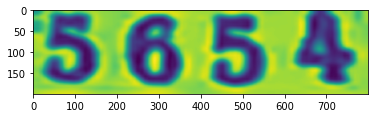

['UPS7d\n\x0c', '5654\n\x0c']


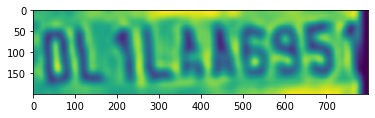

['OUILAKESS¥\n\x0c']


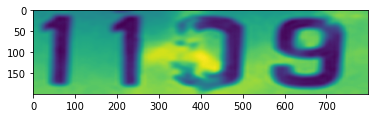

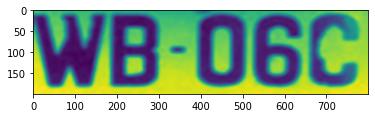

['1TTI3S9\n\x0c', 'WB-06C\n\x0c']


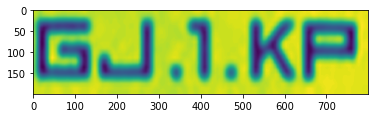

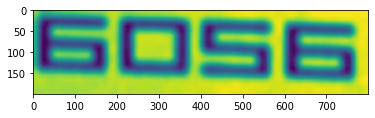

['G.1.KP\n\x0c', '50S6\n\x0c']


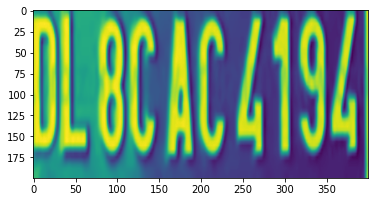

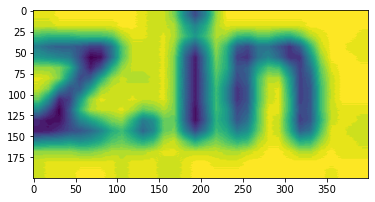

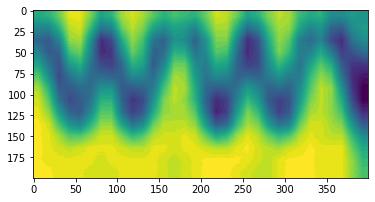

['II WANE\n\x0c', 'Zin\n\x0c', 'ww\n\x0c']


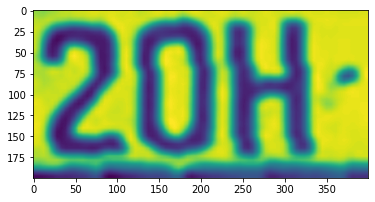

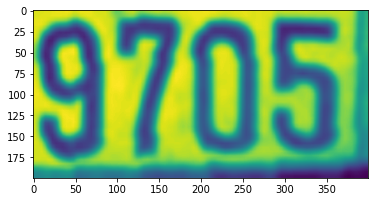

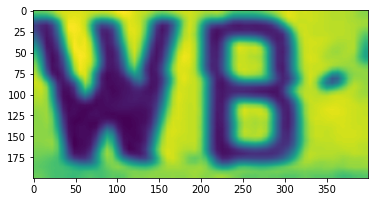

['20H:\n\x0c', '9705)\n\x0c', 'WB-\n\x0c']


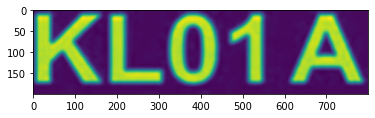

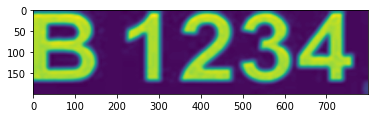

['KLO1A\n\x0c', 'B 1234\n\x0c']


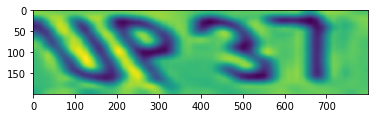

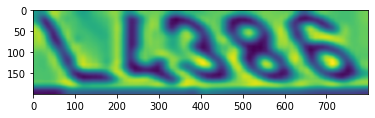

['ea\n\x0c', 'LLA&S\n\x0c']


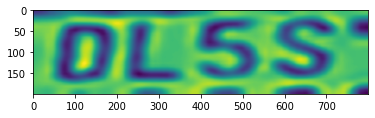

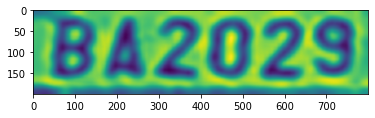

['OoOLSsSS°\n\x0c', 'BA2023\n\x0c']


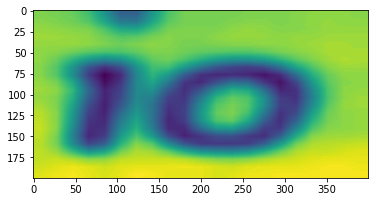

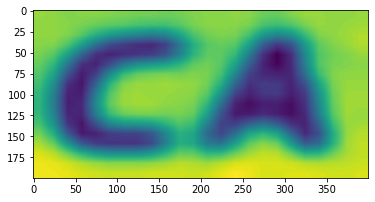

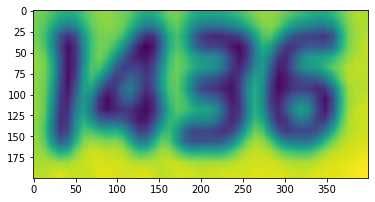

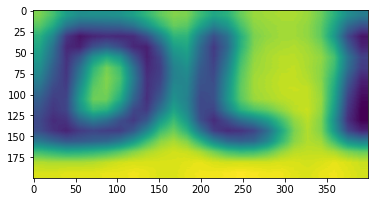

['no\n\x0c', 'CA\n\x0c', '1436\n\x0c', 'Dt i\n\x0c']


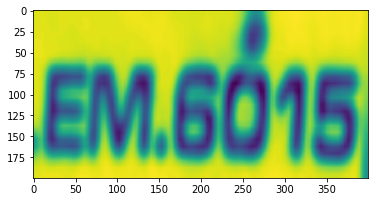

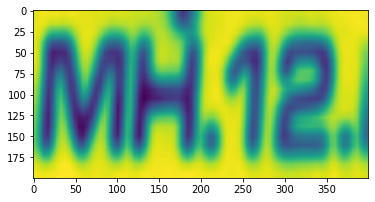

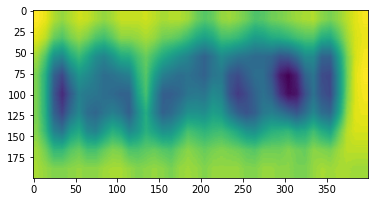

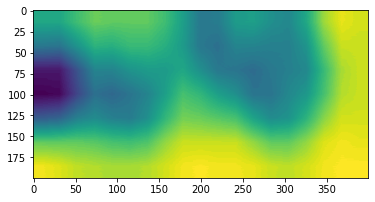

['EM.6015\n\x0c', 'Me.12,\n\x0c', 'were\n\x0c', 'a\n\x0c']


In [66]:
result=[]
for image,prediction in zip(images,predictions):
  if len(prediction)<=2:
    no=[]
    for i in prediction:
      img_ptf = four_point_transform(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY), i[-1].astype(numpy.int32))
      img_ptf=cv2.GaussianBlur(img_ptf, (3,3),0)
      no.append(pytesseract.image_to_string(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_CUBIC),config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'))
      plt.imshow(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_CUBIC))
      plt.show()
    print(no)
    
  else:
    no=[]
    for i in prediction:
      img_ptf = four_point_transform(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY), i[-1].astype(numpy.int32))
      img_ptf=cv2.GaussianBlur(img_ptf, (3,3),0)
      no.append(pytesseract.image_to_string(cv2.resize(img_ptf,(400,200),interpolation=cv2.INTER_LINEAR),config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'))
      plt.imshow(cv2.resize(img_ptf,(400,200),interpolation=cv2.INTER_LINEAR))
      plt.show()
    print(no)

    
  



In [68]:
result

[['WHI2HL9424)'],
 ['ASIF 4', 'LS £2.'],
 ['OL7CN4791'],
 ['439148', 'MA', '_'],
 ['ANOLE'],
 ['37.', 'UP', '£4421'],
 ['TWIOAF 1638', '=='],
 ['MH CBRO3E5)'],
 ['5S', 'DL', '2142', 'AA'],
 ['DU.', '13<éSe'],
 ['o4', 'cH', '1784', '=.'],
 ['WB', '20H', '5315'],
 ['WH12,08.8171'],
 ['WANDS. AAT'],
 ['DL', 'sc', 'AA', '2242', 'NU Atta'],
 ['UP', 'i”', '5596'],
 ['MHO2B', 'D 5678'],
 ['HR29', 'AA', '3004)'],
 ['MH', 'OS', 'BE', '7084', 'tee', 'auto', 'India'],
 ['DL8Ct', '_', '7939'],
 ['UP', '4', 'BASSE4'],
 ['WAYS,', '—', 'WA'],
 ['1173S', 'WB-06C'],
 ['a>', 'DL', 'BUGIZE'],
 ['ANNE'],
 ['2FHEO077'],
 ['-', 'AKAAI36'],
 ['DL', '01A', 'ca', '0123.', '='],
 ['WHI2HL9424)'],
 ['1198383', 'WB-06C'],
 ['HR26AK 9672'],
 ['TNO2AD0812)'],
 ['WH, 04,EX,5888'],
 ['UP? TS', 'BLBl32.'],
 ['OLZSE:', 'KBizZ8i'],
 ['ZEO0Z,', 'WPI'],
 ['DF', '1.', 'Ur', '2186'],
 ['DL', 'Ns', '~', '1937'],
 ['S Pf & Fn', 'ASEZII2'],
 ['KM', 'GULRA.8132'],
 ['uP-14a', 'AE-OR 92'],
 ['T2100', 'MATA', 'Cor bow'],
 ['Men',

In [70]:
import pandas as pd
df=pd.DataFrame()
df["image"]=custom_images
df["Prediction"]=result

In [72]:
df.to_csv("output.csv",index=False)

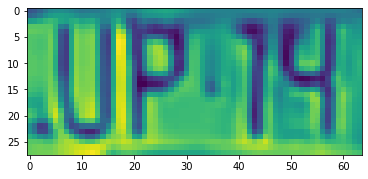

UP TS



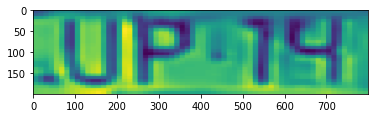

In [ ]:
img_ptf = four_point_transform(cv2.cvtColor(images[2],cv2.COLOR_BGR2GRAY), predictions[2][-2][-1].astype(numpy.int32))
img_ptf=cv2.GaussianBlur(img_ptf, (3,3),0)
plt.imshow(img_ptf)
plt.show()
print(pytesseract.image_to_string(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_AREA),config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=0123456789',))
plt.imshow(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_AREA))
plt.show()

UPETS



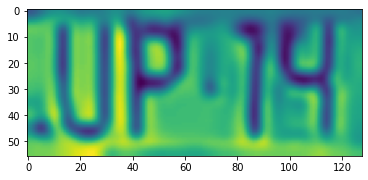

In [ ]:
upscale_image=cv2.pyrUp(img_ptf)
print(pytesseract.image_to_string(img_ptf,config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=0123456789'))
plt.imshow(upscale_image)

In [ ]:
kernel = np.ones((5,5), np.uint8)
img_dilation = cv2.dilate(upscale_image, kernel, iterations=1)

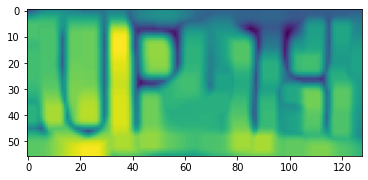

In [ ]:
plt.imshow(img_dilation)

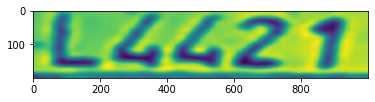

In [ ]:
plt.imshow(cv2.resize(img_ptf,(1000,200),interpolation=cv2.INTER_CUBIC))

In [ ]:
pytesseract.image_to_string(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_AREA),config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=0123456789')

'L4427\n\x0c'

In [ ]:
pytesseract.image_to_string(cv2.resize(img_ptf,(400,200),interpolation=cv2.INTER_LINEAR),config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=0123456789')

'42029\n\x0c'

In [ ]:
plt.imshow(cv2.resize(img_ptf,(800,200),interpolation=cv2.INTER_LINEAR))

In [ ]:
target=cv2.cvtColor(upscale_image,cv2.COLOR_GRAY2BGR)

In [ ]:
(thresh, im_bw) = cv2.threshold(upscale_image, 190, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

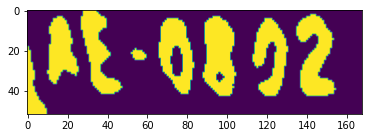

In [ ]:
plt.imshow(im_bw)
plt.show()

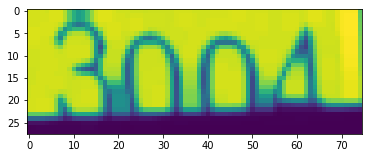

In [ ]:
kernel = np.ones((2,2), np.uint8)
img_erosion = cv2.dilate(img_ptf, kernel, iterations=2)
plt.imshow(img_erosion)
plt.show()

In [ ]:
from scipy.signal import convolve2d as conv2
from skimage import color, data, restoration
rng = np.random.default_rng()
psf = np.ones((5, 5)) / 25
astro=img_ptf
astro = conv2(astro, psf, 'same')
# Add Noise to Image
astro_noisy = astro.copy()
astro_noisy += (rng.poisson(lam=25, size=astro.shape) - 10) / 255.

# Restore Image using Richardson-Lucy algorithm
deconvolved_RL = restoration.richardson_lucy(img_ptf, psf, iterations=30)

/usr/local/lib/python3.7/dist-packages/skimage/restoration/deconvolution.py:385: RuntimeWarning: invalid value encountered in true_divide
  relative_blur = image / convolve_method(im_deconv, psf, 'same')


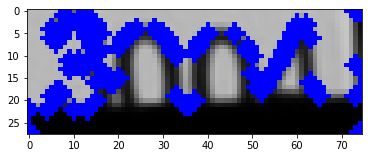

In [ ]:
plt.imshow(target)
plt.show()

In [ ]:
pytesseract.image_to_string(upscale_image,config= f'--psm 13 --oem 3 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')

'S004)\n\x0c'

In [ ]:

import numpy as np

In [ ]:
image = cv2.polylines(images[0], [predictions[0][-1][-1].astype(numpy.int32)], True, (0,0,255), 2)

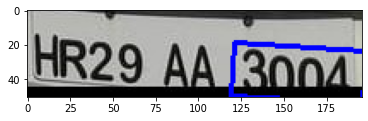

In [ ]:
plt.imshow(image)
plt.show()

In [ ]:
with open('results.txt', 'a+') as f:
  for idx, prediction in enumerate(predictions):
    if(idx != 0):
      print("\n")
      f.write("\n\n")
    print("Results for the file: " + os.path.basename(custom_images[idx]))
    f.write("Results for the file: " + os.path.basename(custom_images[idx]) + ":\n\n")
    for word, array in prediction:
      if word == "\n":
        print("\n")
        f.write("\n")
      else:
        print(word,  end = ' ')
        f.write(word + " ")

Results for the file: documentpdf.png
num 14 jueves 16 2020 sec pag 3969 de de l enero disposiciones generales l ministerio de industria comercio y turismo resolucion 2020 direccion general 612 de 9 de de de la de industria de enero y pequena la mediana empresa la actualiza el listado de por que se normas y itcbto2 de instruccion tecnica complementaria del reglamento la electrotecnico baja tension aprobado el real decreto 84212002 de para por 2 de agosto considerando del electrotecnico apartado del articulo 26 reglamento el 1 que para tension 84212002 baja aprobado real decreto de 2 de agosto estipula clas por que aplicacion instrucciones tecnicas complementarias podran establecer de une la normas otras reconocidas internacionalmente de total parcial fin de facilitar la manera u o a adaptacion al estado de tecnica cada momento la en dicha referencia realizara sin indicar ano de edicion de regla general ell las se por instruccion cuestion en correspondiente tecnica complementaria la nor

In [ ]:
files.download("results.txt")